In [1]:
!pip install easyocr

     |████████████████████████████████| 62.4MB 47kB/s 


In [2]:
path = 'drive/MyDrive/Retrosynthesis/EasyOCR/database/'
import easyocr

reader = easyocr.Reader(['en']) # need to run only once to load model into memory

In [3]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def draw_box(box, color='red'):
    x1, y1, x2, y2 = box
    w = x2 - x1
    h = y2 - y1
    plt.gca().add_patch(
        plt.Rectangle((x1, y1), w, h,
                        fill=False, edgecolor=color, linewidth=2, alpha=0.5)
    )

def imshow(img, cfboxes = [], tboxes = [], color_cf = 'red', color_text = 'blue'):
    plt.figure(figsize = (12,18))
    plt.imshow(img)
       
    for box in cfboxes:
        draw_box(box, color_cf)
    for box in tboxes:
        draw_box(box, color_text)
    plt.plot()
    plt.show()

In [4]:
import re
import numpy as np

text = 'NCH asf Cs Cl C'
result = re.findall(r"C[lsA-Z]+", text)
re.findall(r"^[1-9][a-z]",'4a')
print(result)

def filter_result_easyocr_to_x1y1x2y2text(result, filter = True):
    tboxes = []
    texts = []
    for box in result:
        # set some condition to take box - not Me, ... ~ chemical name
        # rule drawn from observation:
        # text with uppercase letter will be chemical, 
        # then ignore it except 'C','R', or begin with a number
 
        x1,y1 = box[0][0]
        x2,y2 = box[0][2]
        text = box[1]

        if filter == False:
            tboxes.append([x1,y1,x2,y2])
            texts.append(text)
        elif text.islower() or len(re.findall(r"^[0-9]",text)) > 0:
            # (len(re.findall(r"(?![CR])[A-Z]+", text)) == 0 and len(re.findall(r"C[ls]+", text)) == 0):
            tboxes.append([x1,y1,x2,y2])
            texts.append(text)

    no_boxes = len(tboxes)
    # sorting output as ascending x1: insertion sort
    for i in range(no_boxes):
        for j in range(i+1, no_boxes):
            if tboxes[i][0] > tboxes[j][0]: # swap
                # be careful with the memory allocation
                temp = tboxes[i].copy()
                tboxes[i] = tboxes[j].copy()
                tboxes[j] = temp.copy()
                tt = texts[i]
                texts[i] = texts[j]
                texts[j] = tt

    return np.array(tboxes), texts

['CH', 'Cs', 'Cl']


In [5]:
import math

def distance_b(box1, box2): # for box
    dx = max(0, box2[0]-box1[2], box1[0]-box2[2])
    dy = max(0, box2[1]-box1[3], box1[1]-box2[3])
    return math.sqrt(dx*dx + dy**2)
def distance_p(point1, point2): # for center of box
    dx = point2[0] - point1[0]
    dy = point2[1] - point1[1]
    return math.sqrt(dx*dx + dy**2)
def overlap(a1, b1, a2, b2): # between intervals (a1,b1) and (a2,b2), require a1 < b1, a2 < b2
    a = max(a1, a2)
    b = min(b1, b2)
    return b - a if a < b else 0

def merge_textboxes(tboxes, text):
    # return boxes as clusters
    # eg. [[b00,b01,...],[b10,b11,..],...]
    # how close two boxes is to be put into
    # the same cluster? 10% of their total semi perimeter

    no_boxes = len(tboxes)
    prefix = [] # to determine two boxes are from different description, e.g '4a', '3b',...
    queue = [] # arrange boxes in priority, e.g '4a' will prior to '23%'
    divider_index = 0
    for i in range(no_boxes):
        temp = re.findall(r"^[1-9][a-z]", text[i])
        if len(temp) == 0: # not title, add to the back
            prefix.append('')
            queue.append(i)
        else: # may be a title, build the queue carefully
            # '4a', ..., '3a' | <- (divider_index) '', '', ...
            prefix.insert(divider_index, temp[0])
            queue.insert(divider_index, i)
            divider_index += 1
    # rearrange tboxes
    tboxes = tboxes[queue]
    print(prefix)

    # now we will use tboxes and prefix to merge
    clusters = []
    while len(tboxes) > 0:
        # starting with a new one
        print('=== new group ===')
        print('Starting with ', prefix[0])
        group = [0]
        left = list(range(1,len(tboxes)))

        # boxes is < ?00 pixels from the box above
        # can be in the same group
        candidates = [] 
        for i in range(1,len(tboxes)):
            if distance_b(tboxes[i], tboxes[0]) < 200: 
                # change this constant from 100 to 200 after seeing error
                candidates.append(i)

        has_thing_added = True
        title = prefix[0]+' ' # e.g '4a'
        index_title = 0 # track the index of box whose text is '4a' etc
        while has_thing_added:
            has_thing_added = False
            ctemp = candidates.copy()

            for i in candidates:
                box = tboxes[i]
                pre = prefix[i]
                print('Considering ...', pre)
                if pre != '' and pre[0] == title[0]: # eg. '4b' and '4a'
                    print('has same prefix as title. Checking ...')
                    # so box may be the description of other chem. struct.
                    # need to check
                    # calculating relative overlap in two dimensions
                    # (ratio of real overlap and min)
                    title_box = tboxes[index_title]
                    dx = overlap(box[0],box[2], title_box[0],title_box[2])/min(box[2]-box[0], title_box[2]-title_box[0])
                    dy = overlap(box[1],box[3], title_box[1],title_box[3])/min(box[3]-box[1], title_box[3]-title_box[1])
                    # normally either dx or dy must be 0
                    # large dy ->(thẳng hàng) tend to be descriptions of different chem. struct.
                    # large dx -> (thẳng cột) tend to be descriptions of the same chem. struct.

                    # consider some cases that we can REMOVE box from candidate
                    # not have enough 'thẳng cột' or have too much 'thẳng hàng'
                    if dy > 0.5 or dx < 0.3: 
                        ctemp.remove(i)
                        has_thing_added = True # still not check all
                        print('removed')
                        break
                
                # if box is 'compatible' to title_box or usual case
                if True: # Old code has something here, 
                         # then change to if True to not have to re-align code
                    for j in group:
                        b = tboxes[j]                        
                        distance = distance_b(box,b)
                        # semi_perimeter = box[3]+box[2]-box[1]-box[0] + b[3]+b[2]-b[1]-b[0]
                        dy = (box[3]-box[1] + b[3]-b[1])/2
                        relative_distance = distance/dy
                        ## new: also consider overlap score
                        dx = overlap(box[0],box[2], b[0],b[2])/min(box[2]-box[0], b[2]-b[0])
                        dy = overlap(box[1],box[3], b[1],b[3])/min(box[3]-box[1], b[3]-b[1])

                        if relative_distance < 1 and max(dx,dy) > 0.4: 
                            # if close and overlap enough to some box in group, take it
                            print('added')
                            has_thing_added = True
                            group.append(i)
                            left.remove(i)
                            ctemp.remove(i)
                            if prefix[i] != '': 
                                title = prefix[i] # update title of group/description
                                index_title = i   # save index for checking
                            break # don't have to check further
            
            candidates = ctemp.copy()

        clusters.append(tboxes[group])
        tboxes = tboxes[left]
        prefix = [prefix[i] for i in left]

    return clusters

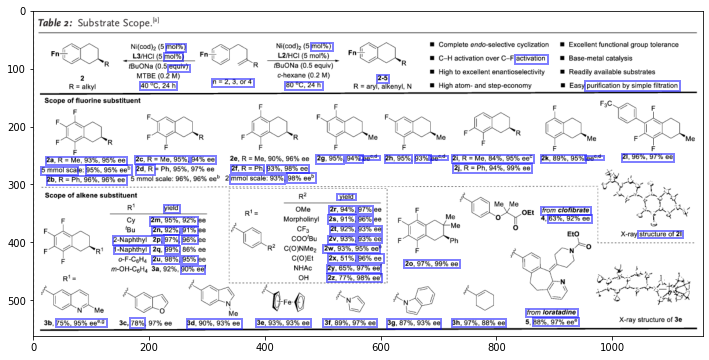

['5m', '2a', '2b', '2c', '2d', '2m', '2n', '2u', '3d', '2f', '3e', '2g', '2w', '3t', '2y', '2z', '2v', '2s', '2x', '2r', '2t', '2h', '3g', '3h', '2i', '2j', '2k', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  5m
Considering ... 2a
added
Considering ... 2b
has same prefix as title. Checking ...
added
Considering ... 2c
has same prefix as title. Checking ...
removed
Considering ... 2d
has same prefix as title. Checking ...
removed
Considering ... 2m
has same prefix as title. Checking ...
removed
Considering ... 2n
has same prefix as title. Checking ...
removed
Considering ... 2u
has same prefix as title. Checking ...
removed
Considering ... 
added
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering .

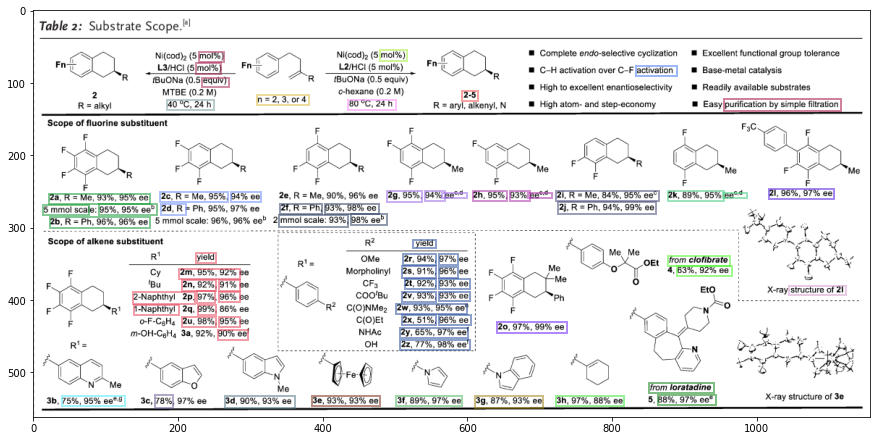

In [6]:
cfboxes = {
    'catal-4.png': [[11,185,115,252],
                    [125,180,276,243],
                    [287,173,387,246],
                    [394,155,531,257],
                    [223,635,507,704]],
    'anie-1.png':  [[77,217,149,285],
                    [402,211,536,275],
                    [403,300,536,369],
                    [403,823,541,889]],
    'anie-2.png': []
}
import random
random.seed(178)

for iname in ['anie-2.png']:
    result = reader.readtext(path+iname)
    image = mpimg.imread(path+iname)

    tboxes, text = filter_result_easyocr_to_x1y1x2y2text(result) # convert to box x1,y1,x2,y2
    imshow(image, cfboxes = cfboxes[iname], tboxes= tboxes)

    clusters = merge_textboxes(tboxes, text)
    plt.figure(figsize = (15,22))
    plt.imshow(image)
    for cluster in clusters:
        color = list(np.random.choice(range(256), size=3)/255)
        for box in cluster:
            draw_box(box, color)
    
    plt.plot()
    plt.show()    

=========== anie-1.png ============


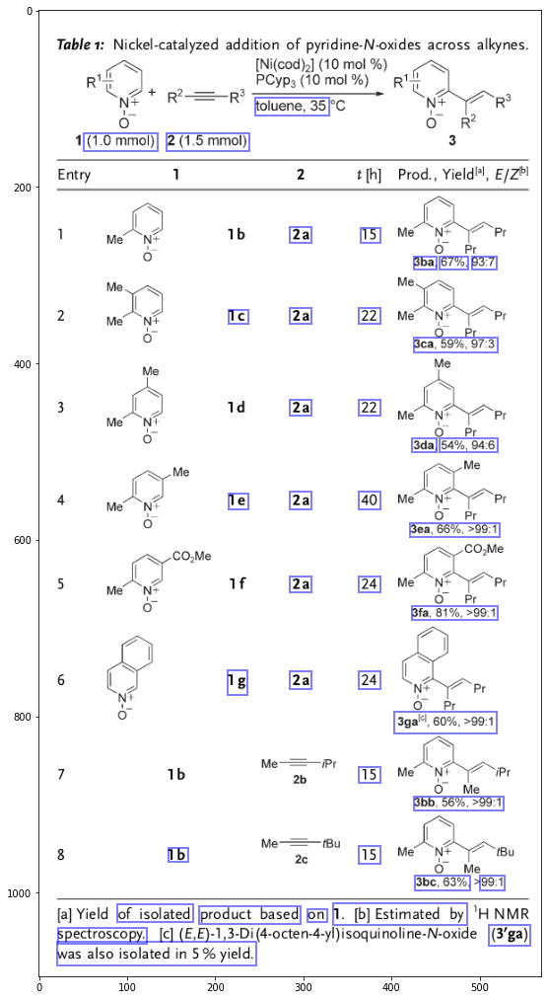

['1g', '2a', '2a', '2a', '2a', '2a', '2a', '3g', '3e', '3f', '3d', '3b', '3c', '3b', '3b', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  1g
Considering ... 2a
Considering ... 2a
Considering ... 2a
Considering ... 3g
Considering ... 3f
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  2a
Considering ... 2a
has same prefix as title. Checking ...
Considering ... 2a
has same prefix as title. Checking ...
Considering ... 2a
has same prefix as title. Checking ...
Considering ... 3d
Considering ... 3b
Considering ... 3c
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  2a
Considering ... 2a
has same prefix as title. Checking ...
Considering ... 2a
has same prefix as title. Checking ...
Cons

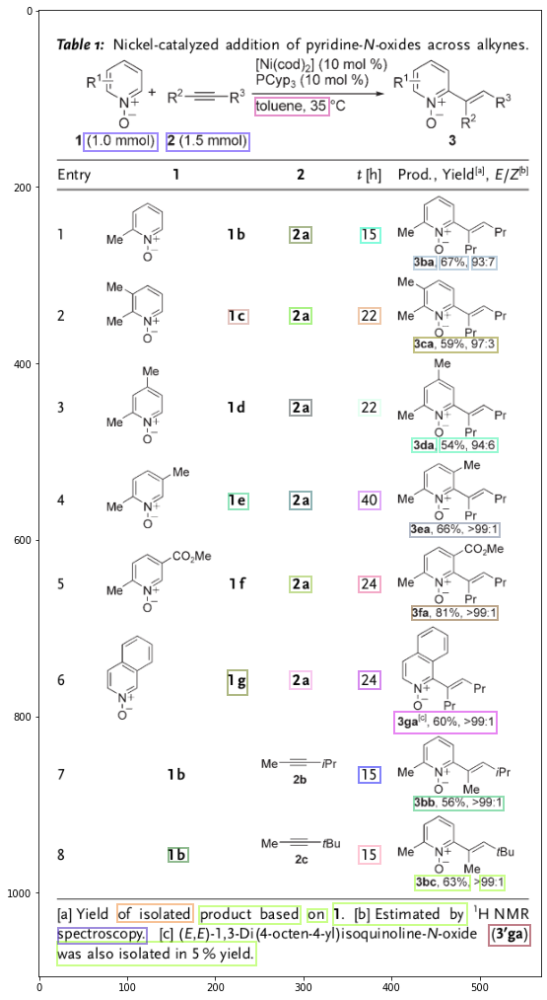

=========== anie-2.png ============


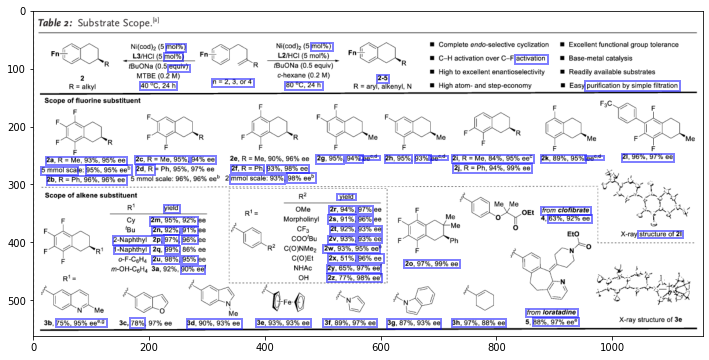

['5m', '2a', '2b', '2c', '2d', '2m', '2n', '2u', '3d', '2f', '3e', '2g', '2w', '3t', '2y', '2z', '2v', '2s', '2x', '2r', '2t', '2h', '3g', '3h', '2i', '2j', '2k', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  5m
Considering ... 2a
added
Considering ... 2b
has same prefix as title. Checking ...
added
Considering ... 2c
has same prefix as title. Checking ...
removed
Considering ... 2d
has same prefix as title. Checking ...
removed
Considering ... 2m
has same prefix as title. Checking ...
removed
Considering ... 2n
has same prefix as title. Checking ...
removed
Considering ... 2u
has same prefix as title. Checking ...
removed
Considering ... 
added
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering .

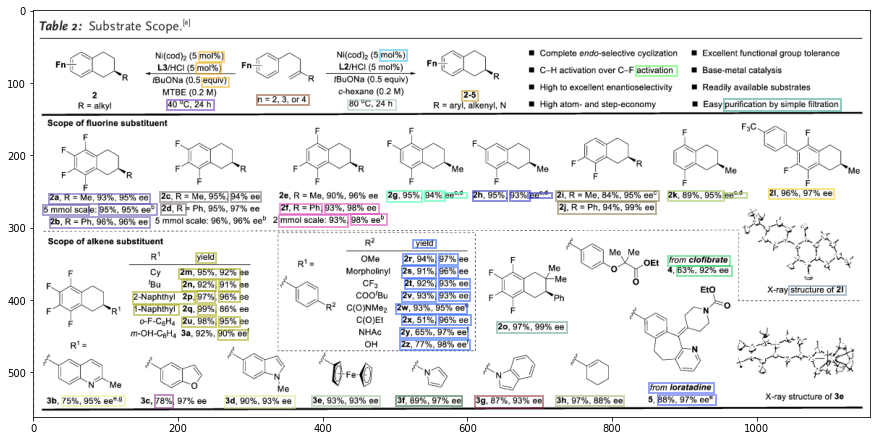

=========== anie-3.png ============


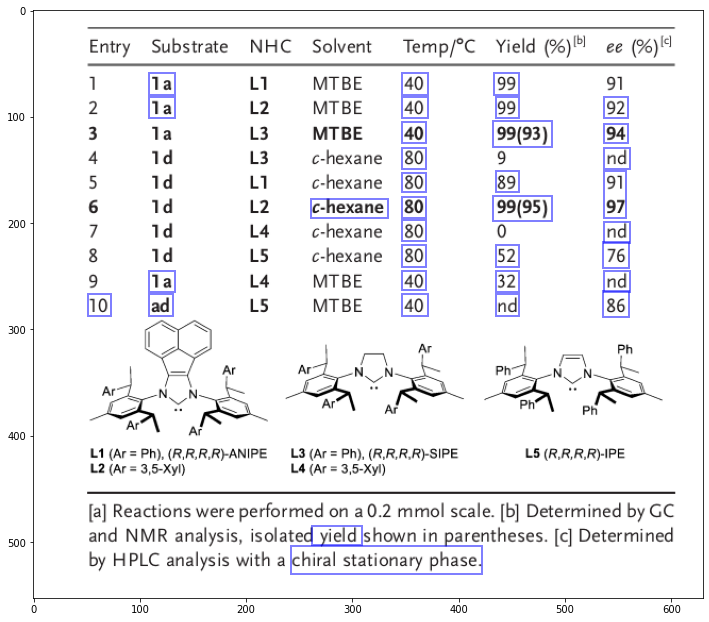

['', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
Considering ... 
added
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
added
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
added
=== new group ===
Starting with  
Considering ... 
added
Considering ... 
added
Considering ... 
added
Considering ... 
Considering ... 
added
Considering ... 
Considering ... 
Considering ... 
added
Considering ... 
added
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
added
Considering ... 
Cons

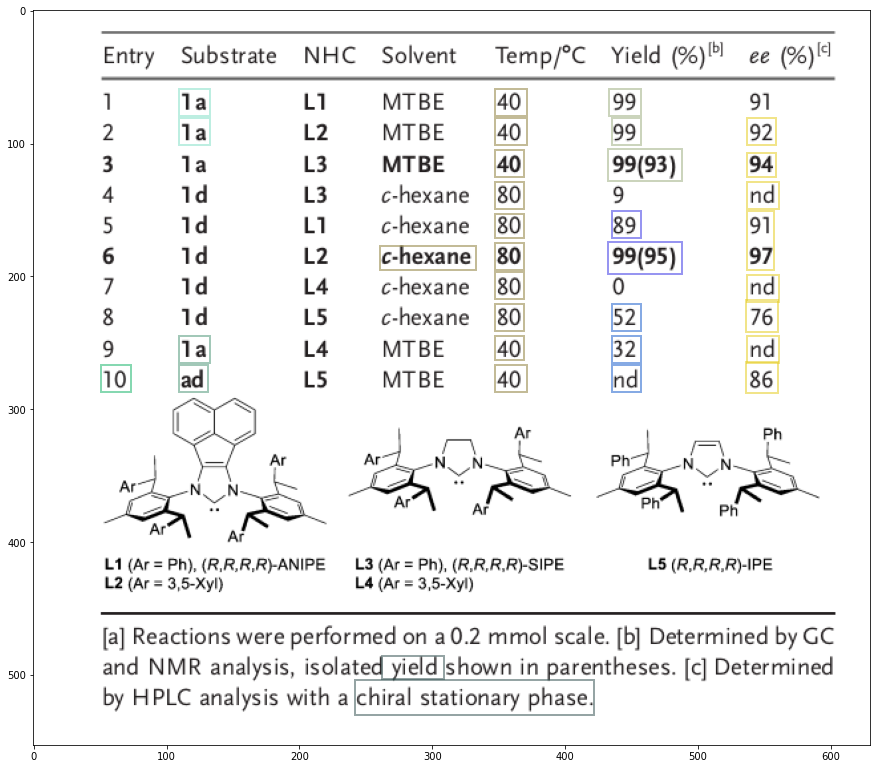

=========== anie-4.png ============


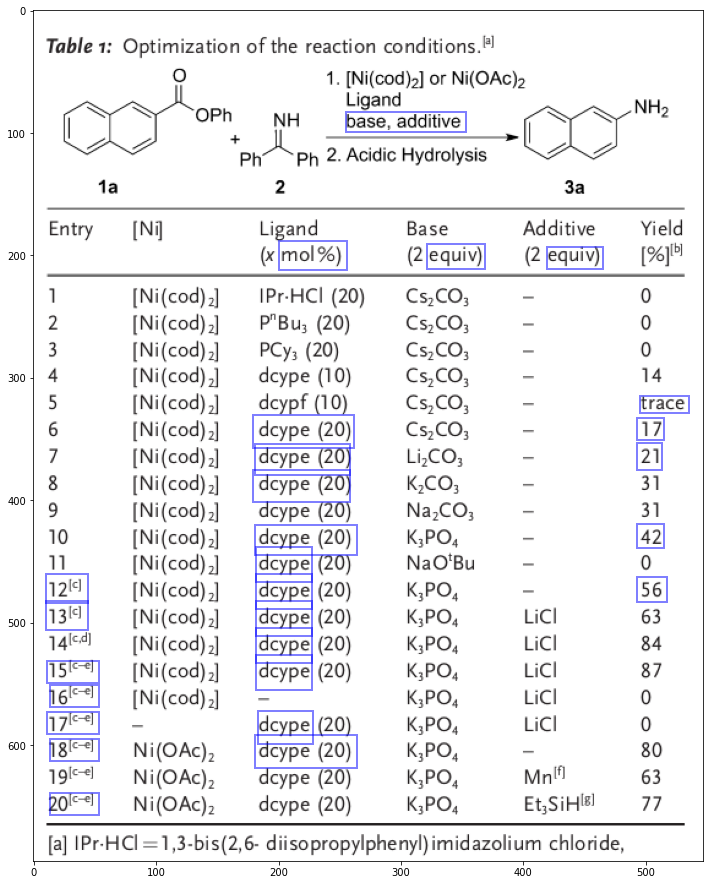

['', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  
Considering ... 
added
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
Considering ... 
added
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering 

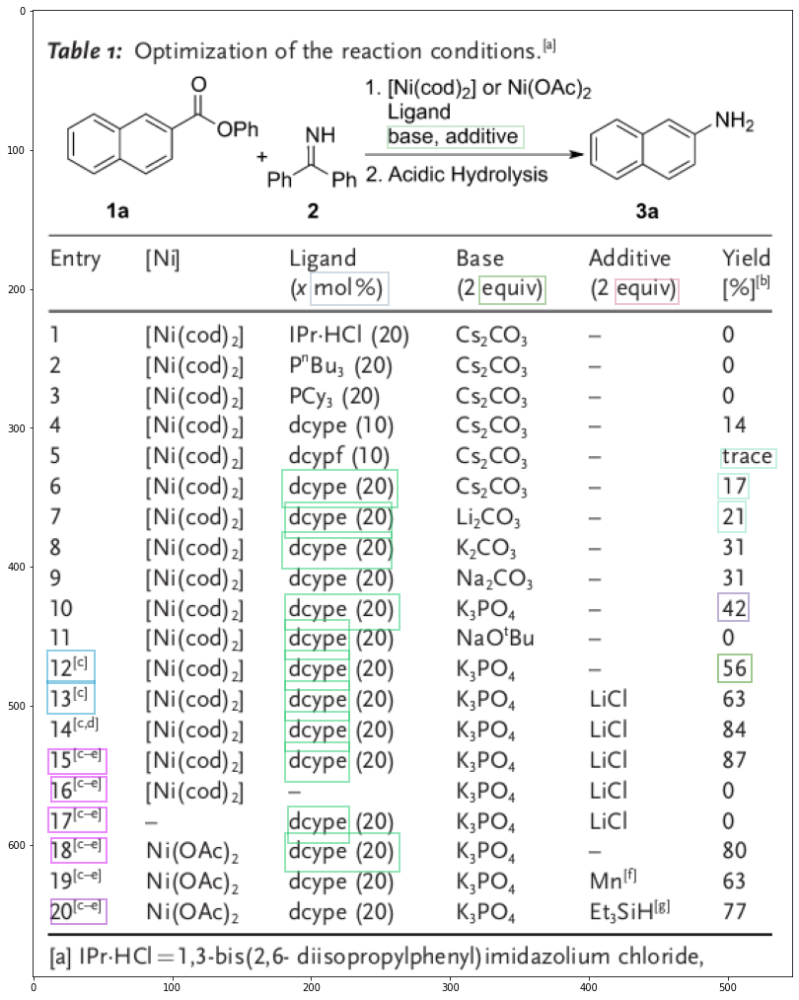

=========== anie-5.png ============


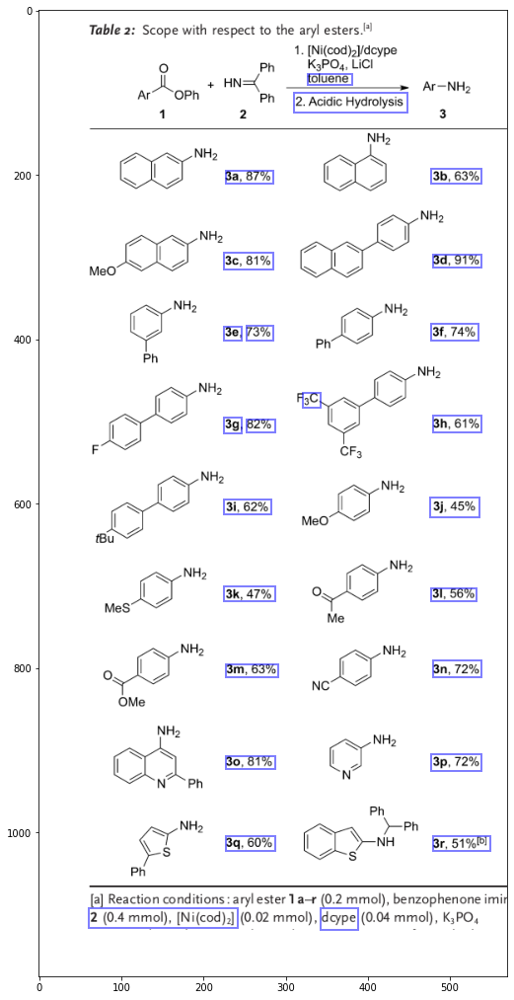

['3e', '3g', '3i', '3k', '3c', '3m', '3q', '3a', '3j', '3p', '3b', '3f', '3n', '3r', '3h', '3d', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  3e
Considering ... 3g
has same prefix as title. Checking ...
Considering ... 3i
has same prefix as title. Checking ...
Considering ... 3c
has same prefix as title. Checking ...
Considering ... 3a
has same prefix as title. Checking ...
Considering ... 
added
Considering ... 
Considering ... 
Considering ... 3g
has same prefix as title. Checking ...
Considering ... 3i
has same prefix as title. Checking ...
Considering ... 3c
has same prefix as title. Checking ...
Considering ... 3a
has same prefix as title. Checking ...
Considering ... 
Considering ... 
=== new group ===
Starting with  3g
Considering ... 3i
has same prefix as title. Checking ...
Considering ... 3k
has same prefix as title. Checking ...
Considering ... 3c
has same prefix as title. Checking ...
Considering ... 
added
Considering ... 
Considering ... 3i
has sam

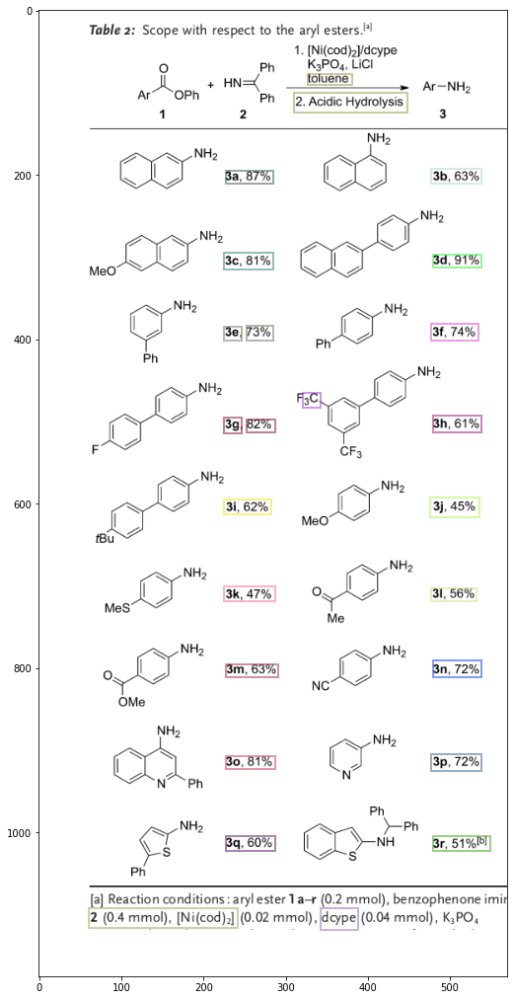

=========== anie-6.png ============


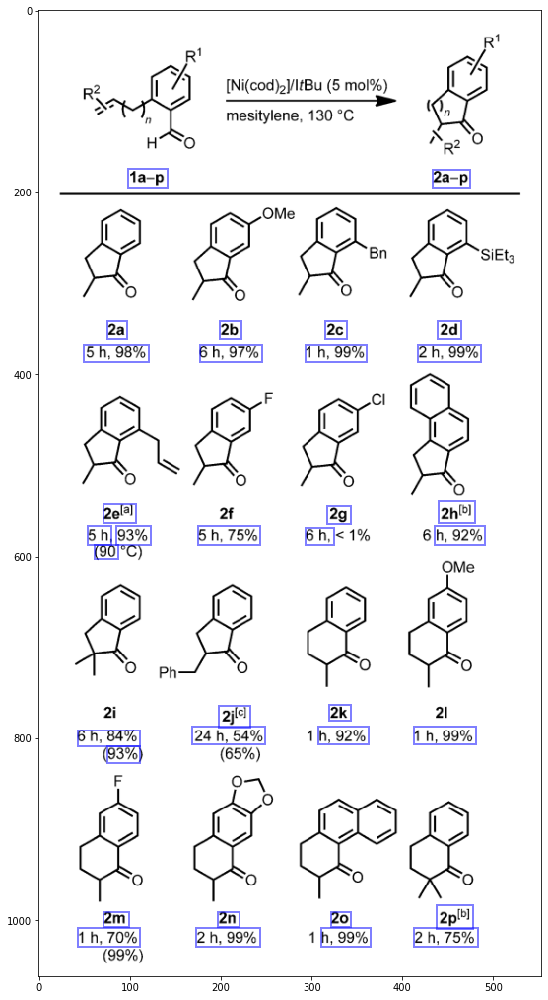

['1h', '5h', '5h', '2e', '2m', '2a', '2n', '2j', '2b', '1h', '6h', '2c', '2g', '2k', '2o', '1h', '2a', '2p', '2d', '2h', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  1h
Considering ... 2m
added
Considering ... 2n
has same prefix as title. Checking ...
removed
Considering ... 
Considering ... 
=== new group ===
Starting with  5h
Considering ... 5h
has same prefix as title. Checking ...
Considering ... 2e
Considering ... 2a
added
Considering ... 2b
has same prefix as title. Checking ...
removed
Considering ... 5h
Considering ... 2e
has same prefix as title. Checking ...
Considering ... 1h
Considering ... 2c
has same prefix as title. Checking ...
removed
Considering ... 5h
Considering ... 2e
has same prefix as title. Checking ...
Considering ... 1h
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  5h
Considering ... 2e
Considering ... 
added
Considering ... 
added
Considering ... 
Considering ..

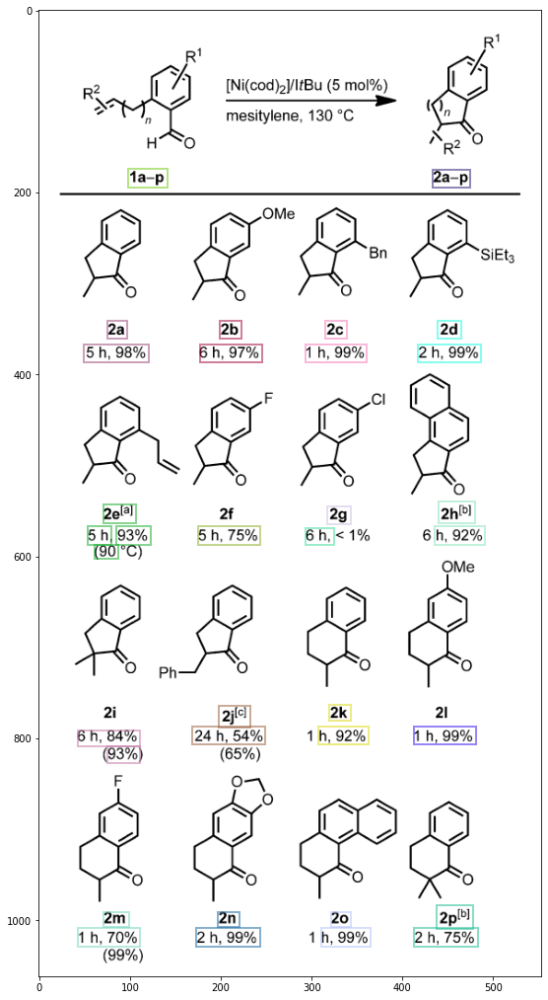

=========== catal-1.png ============


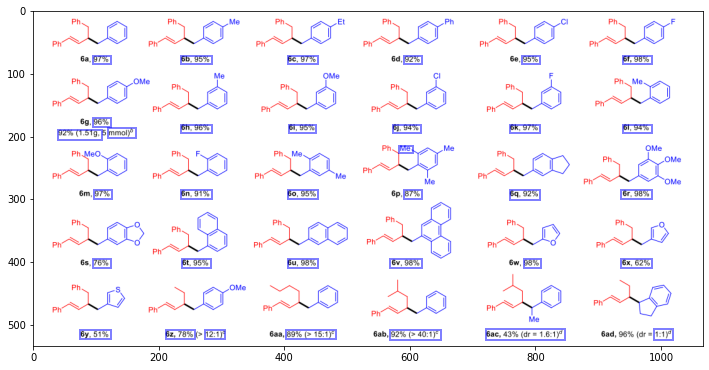

['6y', '6z', '6l', '6b', '6n', '6t', '6o', '6u', '6c', '6i', '6v', '6j', '6a', '6k', '6q', '6r', '6x', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  6y
Considering ... 6z
has same prefix as title. Checking ...
removed
Considering ... 6t
has same prefix as title. Checking ...
removed
Considering ... 
Considering ... 
=== new group ===
Starting with  6z
Considering ... 6t
has same prefix as title. Checking ...
Considering ... 6u
has same prefix as title. Checking ...
removed
Considering ... 6t
has same prefix as title. Checking ...
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  6l
Considering ... 6b
has same prefix as title. Checking ...
Considering ... 6n
has same prefix as title. Checking ...
Considering ... 6o
has same prefix as title. Checking ...
removed
Considering ... 6b
has same prefix as title. Checking ...
Considering ... 6n
has same prefix as title. Checking ...
Considering ... 6c
has s

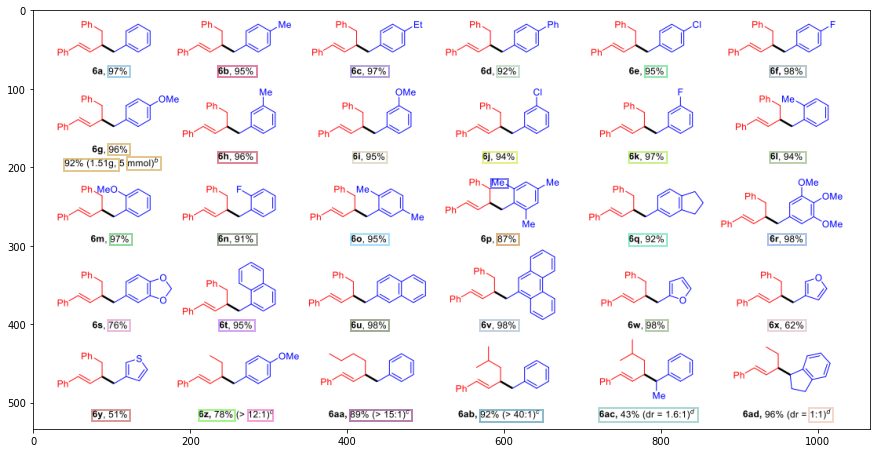

=========== catal-2.png ============


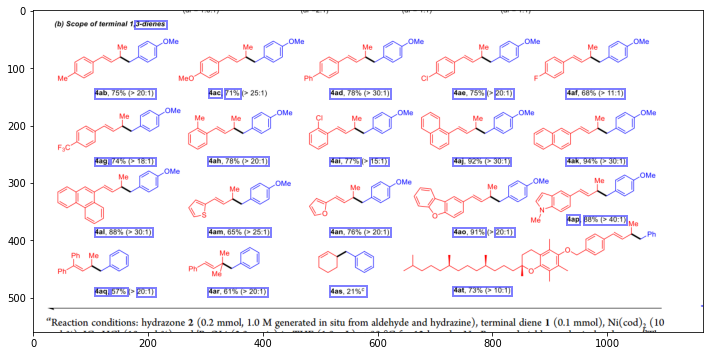

['4a', '4a', '4a', '4a', '4a', '4a', '4a', '4a', '4a', '4a', '4a', '4a', '4a', '4a', '4a', '4a', '4a', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  4a
Considering ... 4a
has same prefix as title. Checking ...
Considering ... 4a
has same prefix as title. Checking ...
removed
Considering ... 4a
has same prefix as title. Checking ...
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  4a
Considering ... 4a
has same prefix as title. Checking ...
Considering ... 4a
has same prefix as title. Checking ...
removed
Considering ... 4a
has same prefix as title. Checking ...
Considering ... 
added
Considering ... 4a
has same prefix as title. Checking ...
=== new group ===
Starting with  4a
Considering ... 4a
has same prefix as title. Checking ...
Considering ... 4a
has same prefix as title. Checking ...
removed
Considering ... 4a
has same prefix as title. Checking ...
Considering ... 4a
has same prefix as title. Check

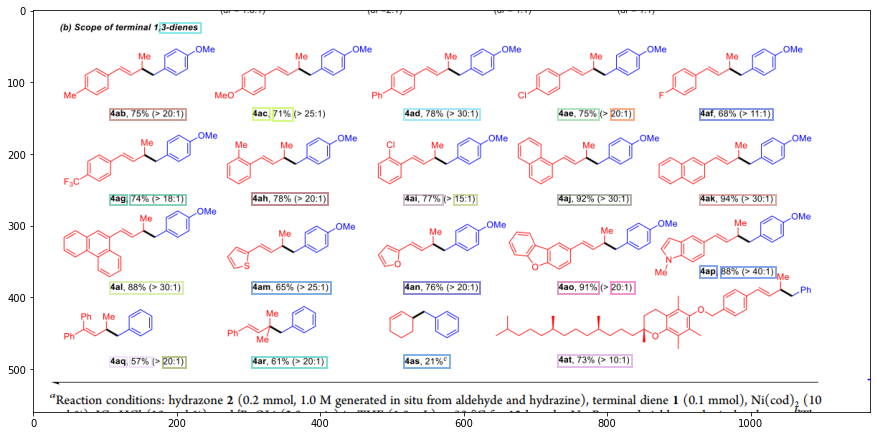

=========== catal-3.png ============


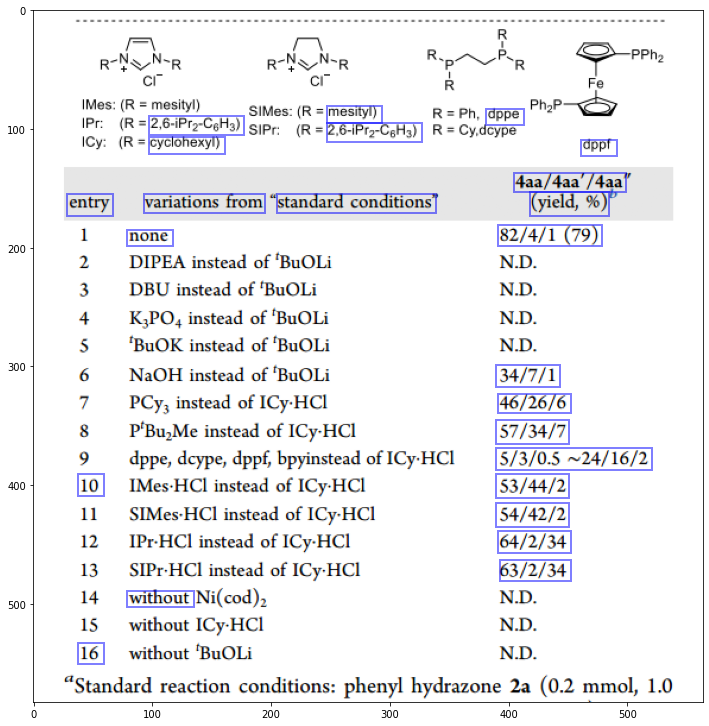

['4a', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  4a
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
added
Considering ... 
added
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
added
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
=== new group ===
Starting with  
=== new group ===
Starting with  
Considering ... 
added
Considering ... 
Considering ... 
Consider

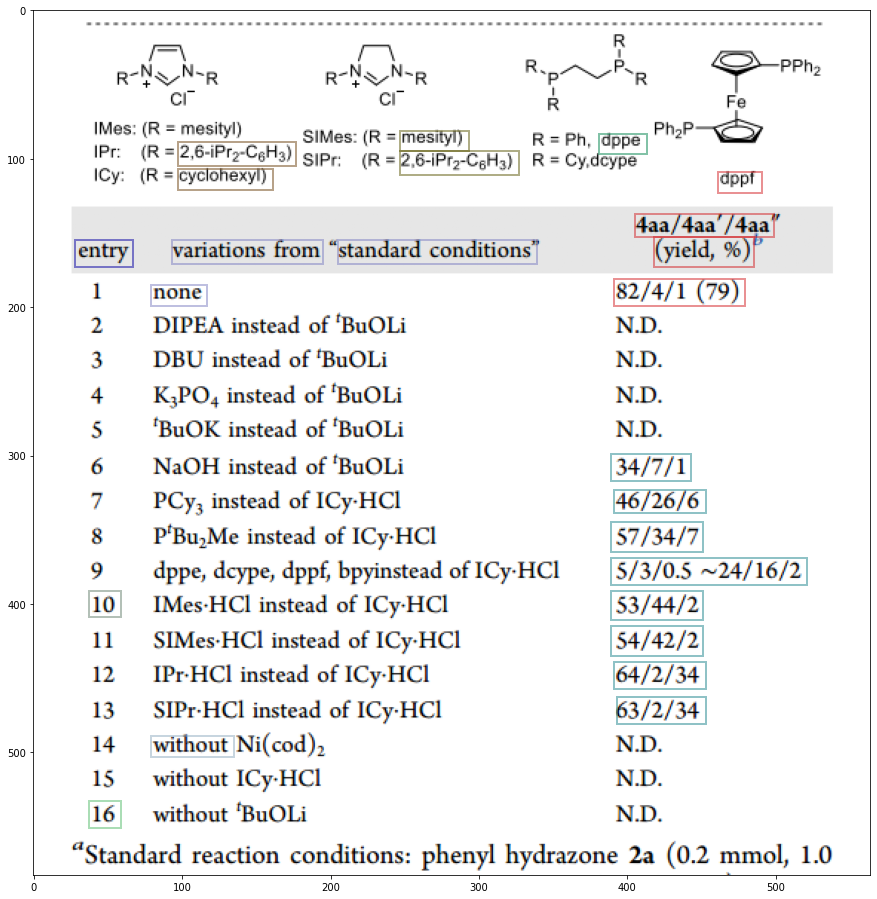

=========== catal-4.png ============


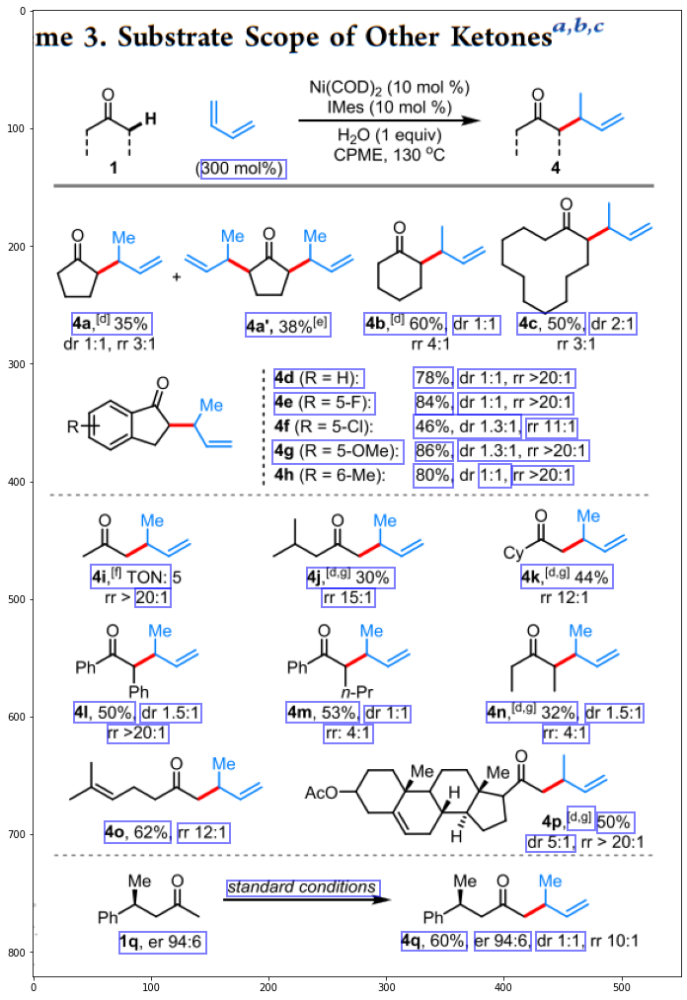

['4a', '4i', '1q', '4a', '4g', '4d', '4e', '4m', '4j', '4b', '4q', '4n', '4c', '4k', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  4a
Considering ... 4i
has same prefix as title. Checking ...
Considering ... 4a
has same prefix as title. Checking ...
removed
Considering ... 4i
has same prefix as title. Checking ...
Considering ... 4g
has same prefix as title. Checking ...
removed
Considering ... 4i
has same prefix as title. Checking ...
Considering ... 4d
has same prefix as title. Checking ...
removed
Considering ... 4i
has same prefix as title. Checking ...
Considering ... 4e
has same prefix as title. Checking ...
removed
Considering ... 4i
has same prefix as title. Checking ...
Considering ... 4b
has same prefix as title. Checking ...
removed
Considering ... 4i
has same prefix as title. Checking ...
Considering ... 
=== new group ===
Starting with  4i
Considering ... 4g
has s

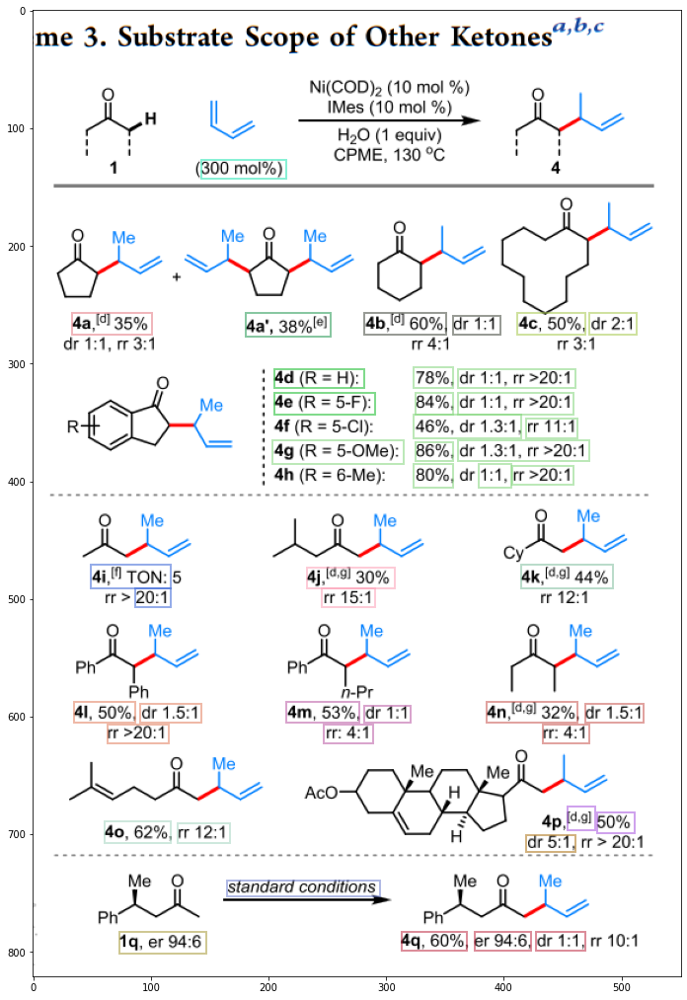

=========== catal-5.png ============


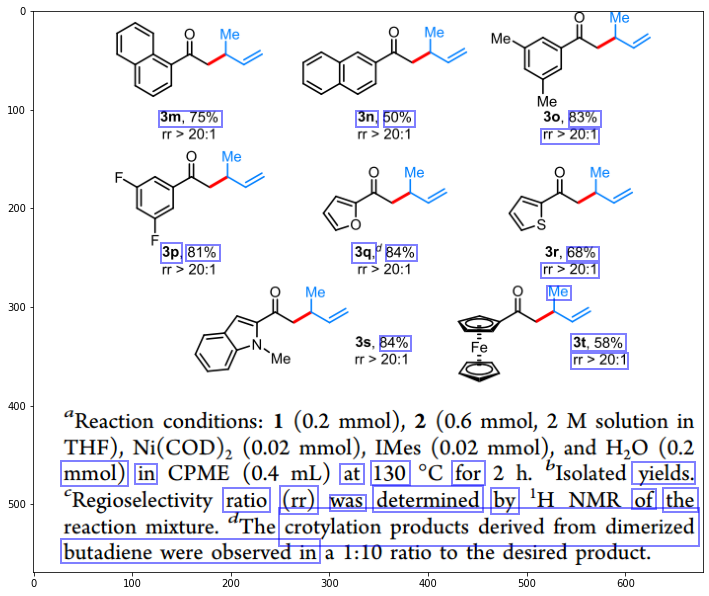

['3m', '3p', '3q', '3n', '3t', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  3m
Considering ... 3p
has same prefix as title. Checking ...
Considering ... 3q
has same prefix as title. Checking ...
removed
Considering ... 3p
has same prefix as title. Checking ...
Considering ... 3n
has same prefix as title. Checking ...
removed
Considering ... 3p
has same prefix as title. Checking ...
Considering ... 
Considering ... 
=== new group ===
Starting with  3p
Considering ... 3q
has same prefix as title. Checking ...
removed
Considering ... 
added
=== new group ===
Starting with  3q
Considering ... 3n
has same prefix as title. Checking ...
Considering ... 
Considering ... 
Considering ... 
added
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 3n
has same prefix as title. Checking ...
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Consid

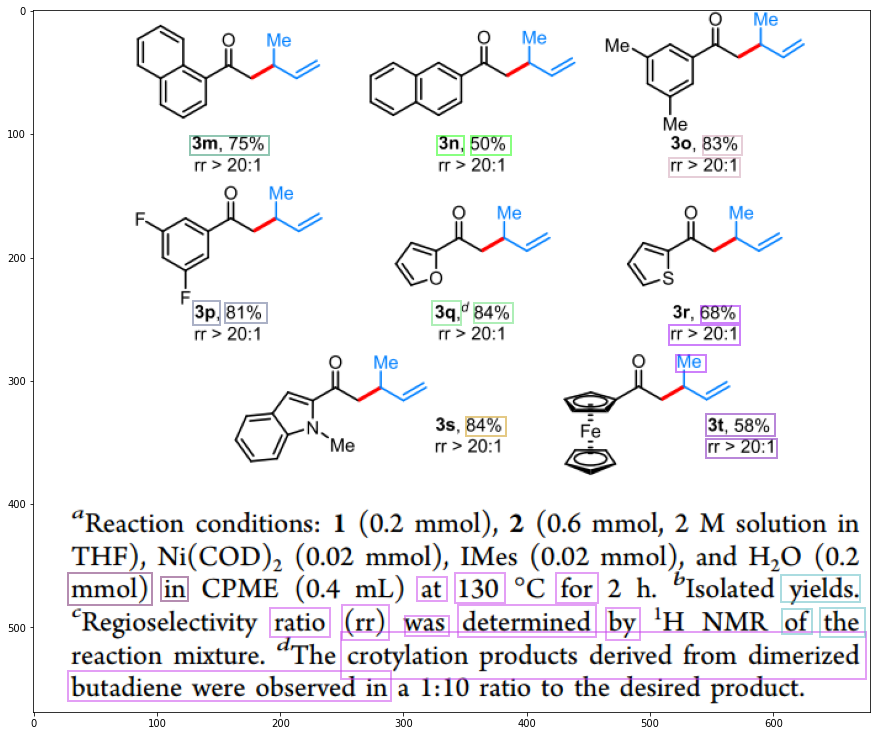

=========== catal-6.png ============


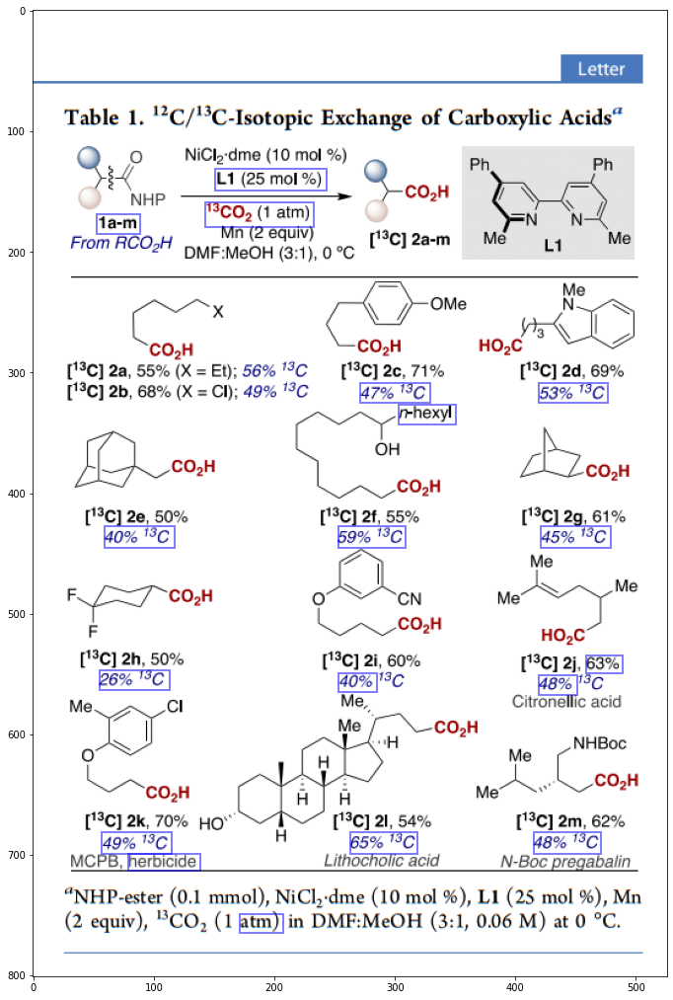

['', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
added
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
added
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ..

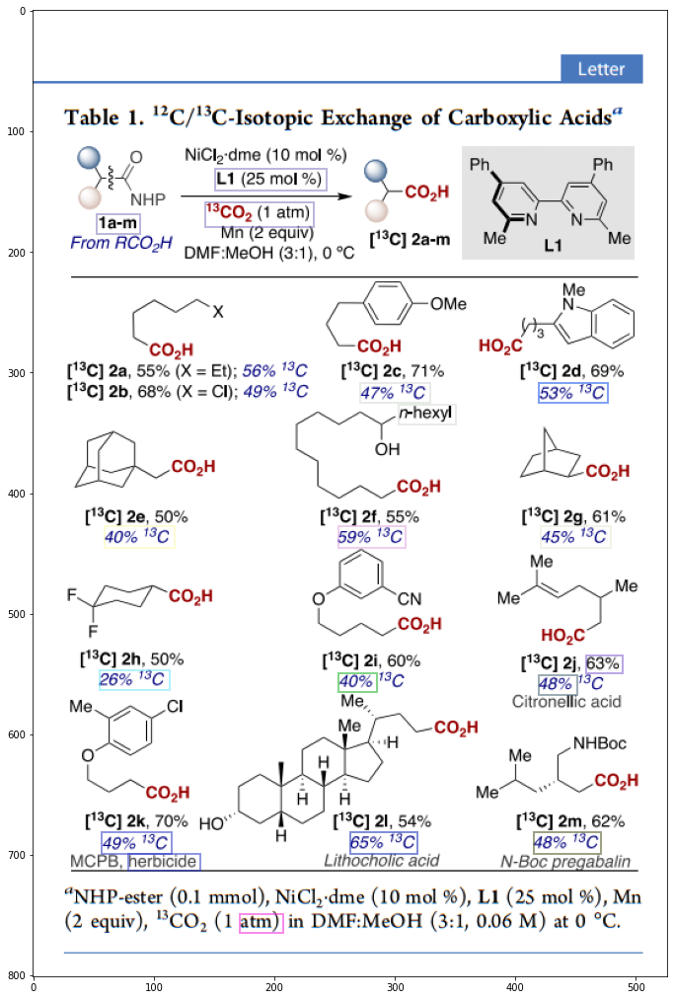

=========== catal-7.png ============


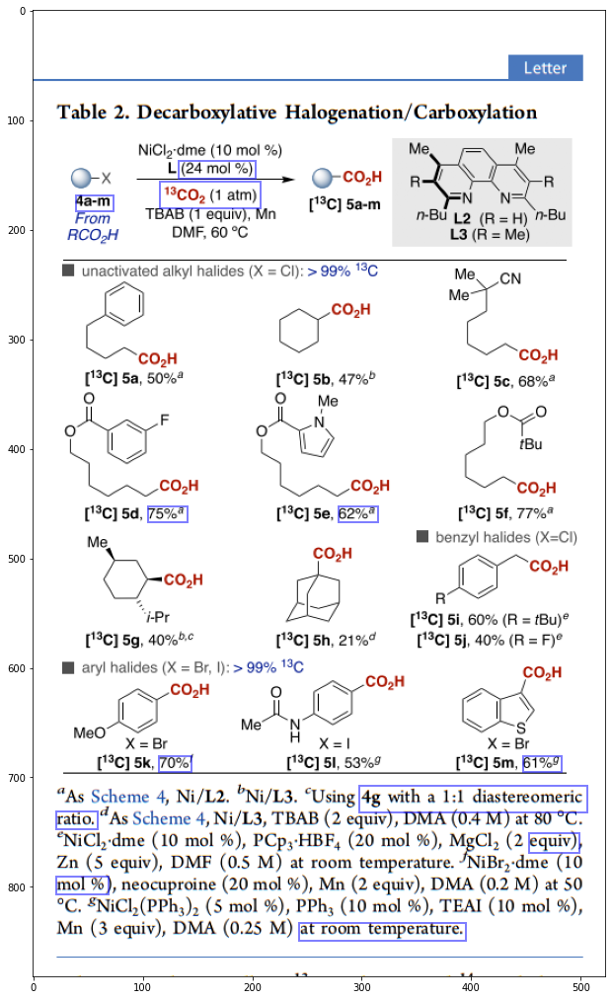

['4g', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  4g
Considering ... 
Considering ... 
Considering ... 
added
Considering ... 
added
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
=== new group ===
Starting with  
Considering ... 
=== new group ===
Starting with  
Considering ... 
added
=== new group ===
Starting with  
=== new group ===
Starting with  


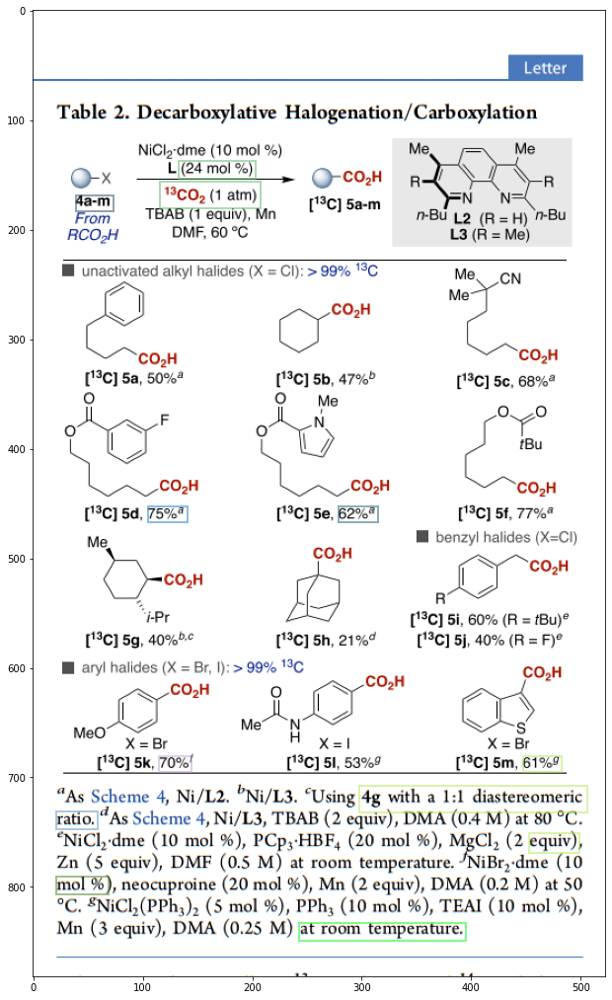

=========== jacs-1.png ============


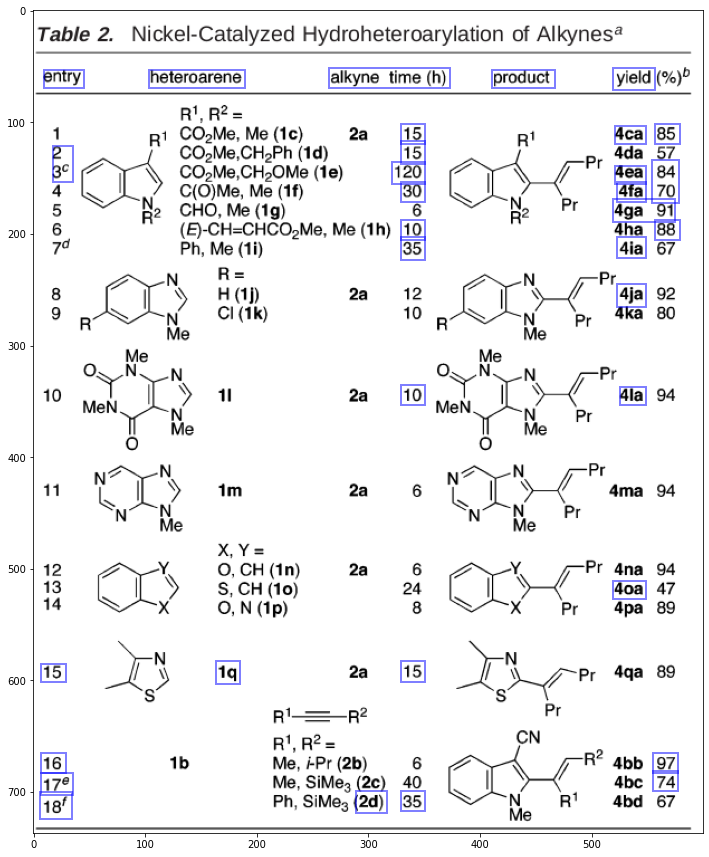

['3c', '2d', '4o', '4g', '4j', '4f', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  3c
Considering ... 
Considering ... 
=== new group ===
Starting with  2d
Considering ... 
Considering ... 
Considering ... 
added
Considering ... 
Considering ... 
=== new group ===
Starting with  4o
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  4g
Considering ... 4j
has same prefix as title. Checking ...
Considering ... 4f
has same prefix as title. Checking ...
added
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
added
Considering ... 
added
Considering ... 
Considering ... 
added
Considering ... 
added
Considering ... 
added
Considering ... 4j
has same prefix as title. Checking ...
Considering ... 
Considering ...

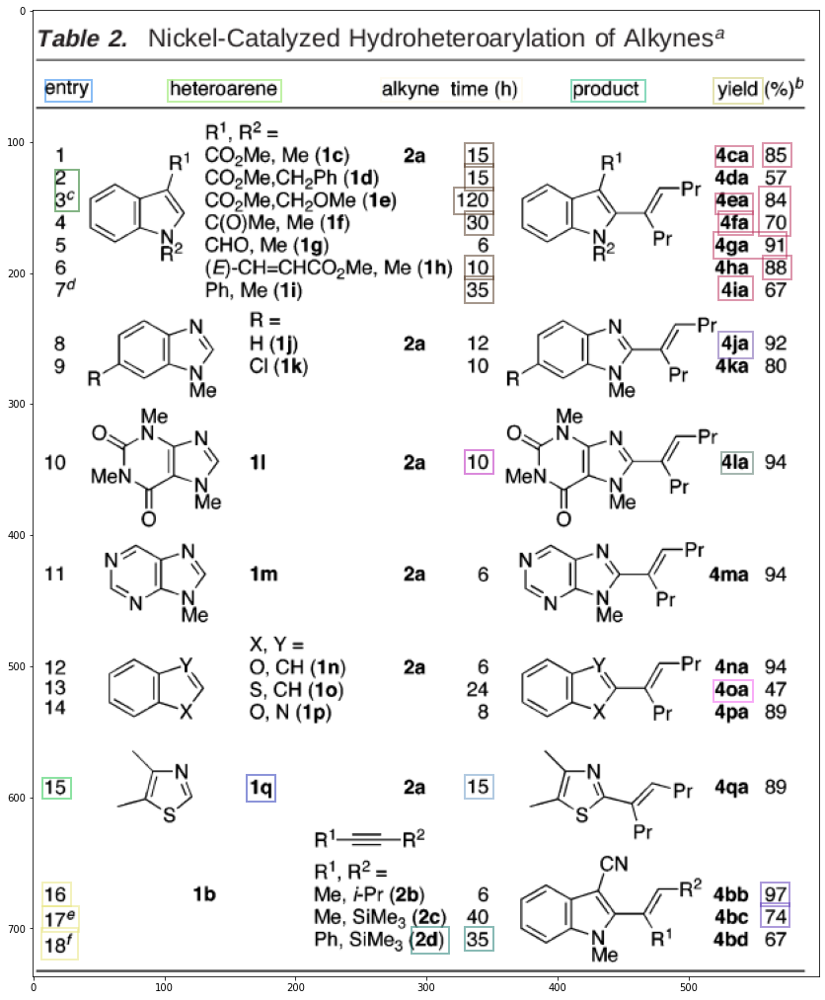

=========== jacs-2.png ============


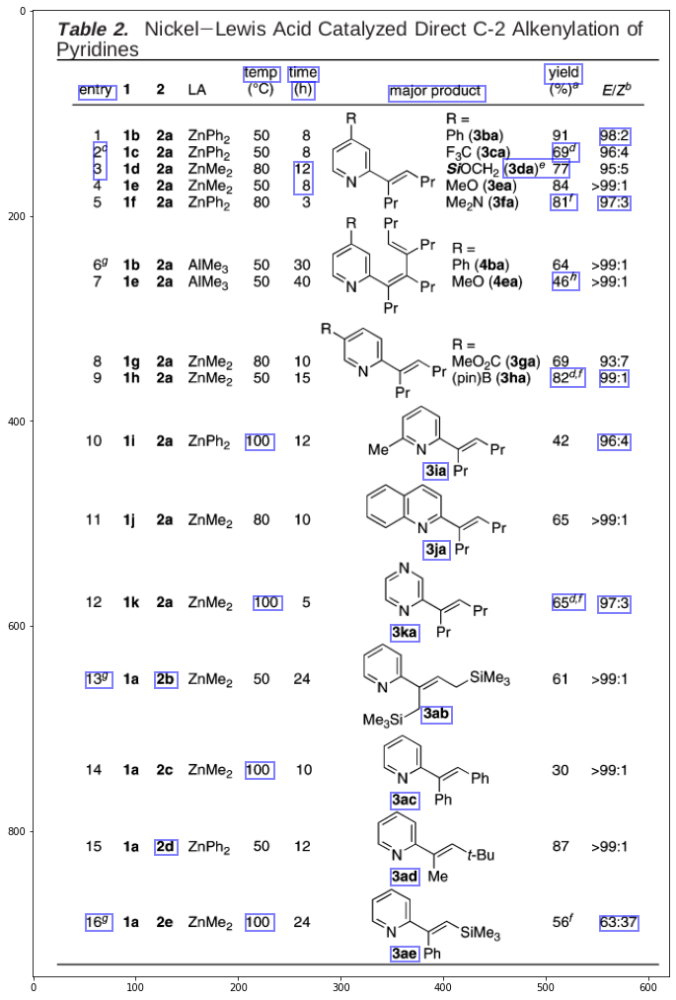

['2b', '2d', '3a', '3k', '3a', '3a', '3a', '3j', '3i', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  2b
Considering ... 2d
has same prefix as title. Checking ...
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  2d
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  3a
Considering ... 3k
has same prefix as title. Checking ...
Considering ... 3a
has same prefix as title. Checking ...
Considering ... 3a
has same prefix as title. Checking ...
Considering ... 3a
has same prefix as title. Checking ...
removed
Considering ... 3k
has same prefix as title. Checking ...
Considering ... 3a
has same prefix as title. Checking ...
Considering ... 3a
has same prefix as title. Checking ...
Considering ... 
Considering ... 
=== new group ===
Starting with  3k
Considering ... 3a
has same prefix as title. Checking ...
removed
Consid

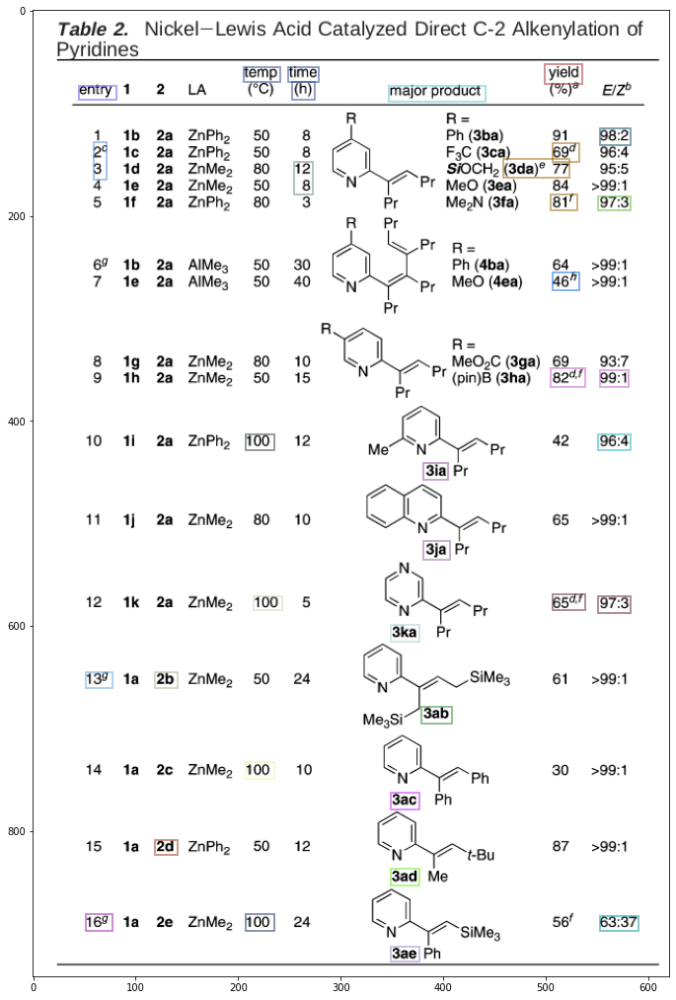

=========== jacs-3.png ============


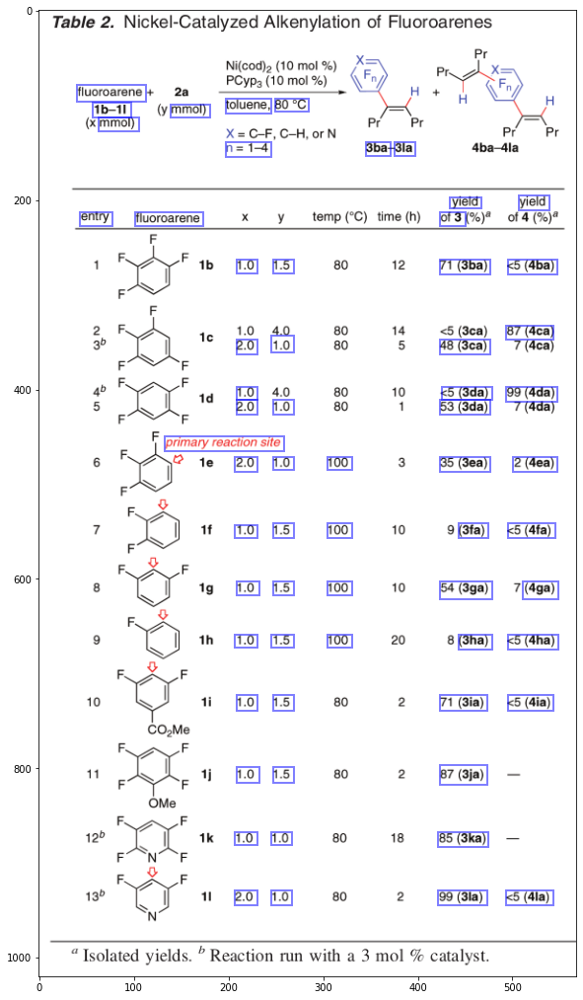

['1b', '3b', '3l', '3h', '4g', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  1b
Considering ... 
added
Considering ... 
Considering ... 
added
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  3b
Considering ... 3l
has same prefix as title. Checking ...
removed
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  3l
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Conside

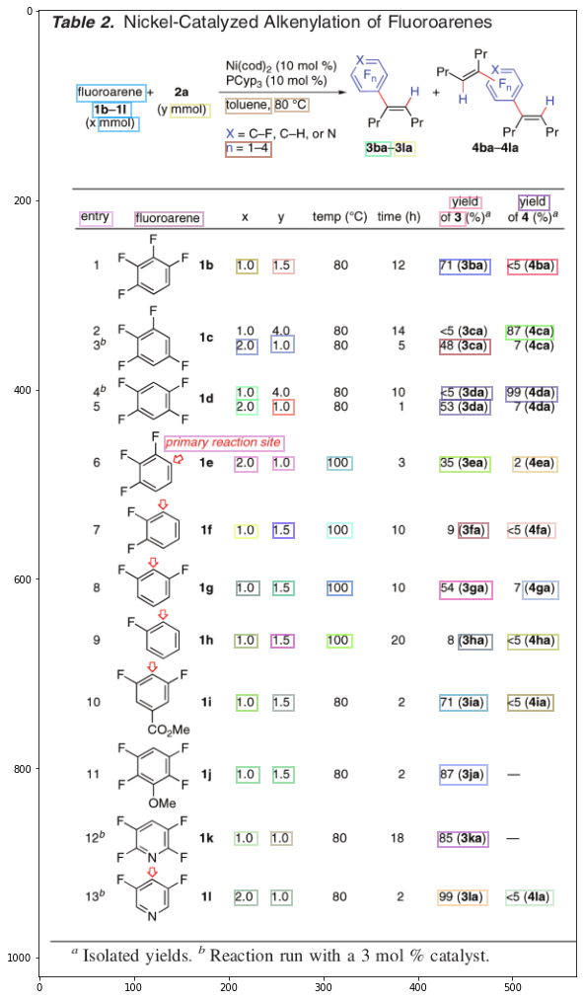

=========== jacs-4.png ============


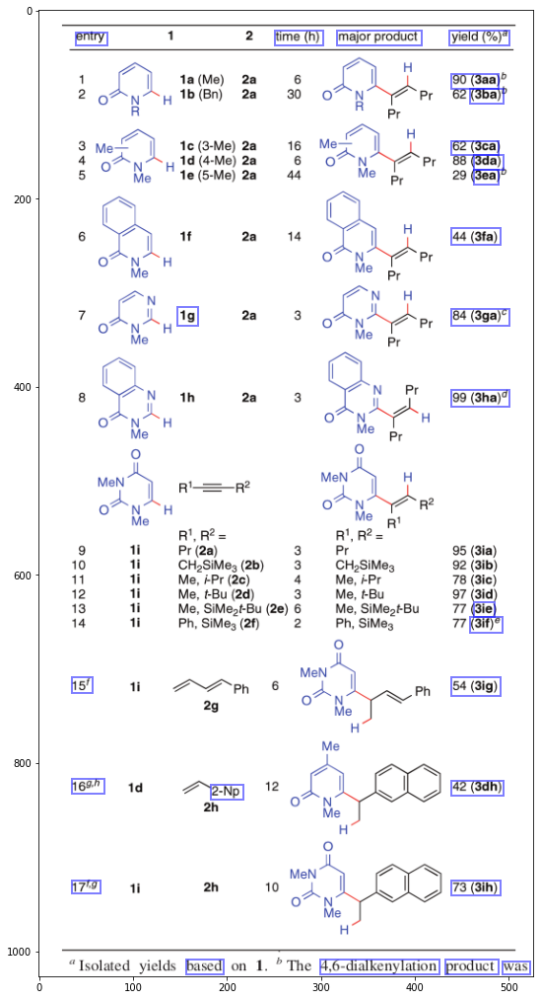

['1g', '3b', '3i', '3d', '3e', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  1g
=== new group ===
Starting with  3b
Considering ... 3d
has same prefix as title. Checking ...
Considering ... 3e
has same prefix as title. Checking ...
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
added
Considering ... 
Considering ... 3d
has same prefix as title. Checking ...
Considering ... 3e
has same prefix as title. Checking ...
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  3i
Considering ... 
Considering ... 
Considering ... 
added
Considering ... 
Considering ... 
=== new group ===
Starting with  3d
Considering ... 3e
has same prefix as title. Checking ...
added
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
added
Considering ... 
Considering ... 
Considering ... 
Co

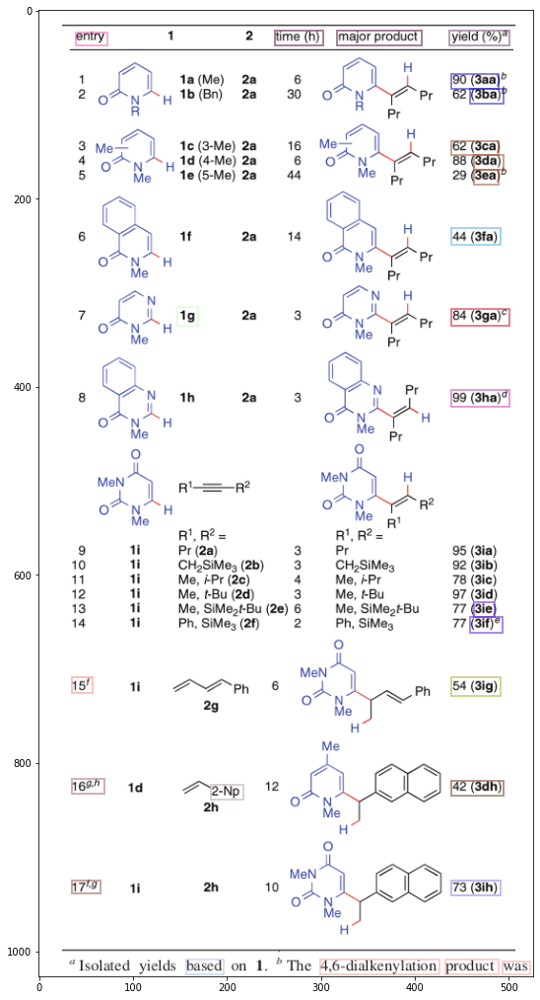

=========== jacs-5.png ============


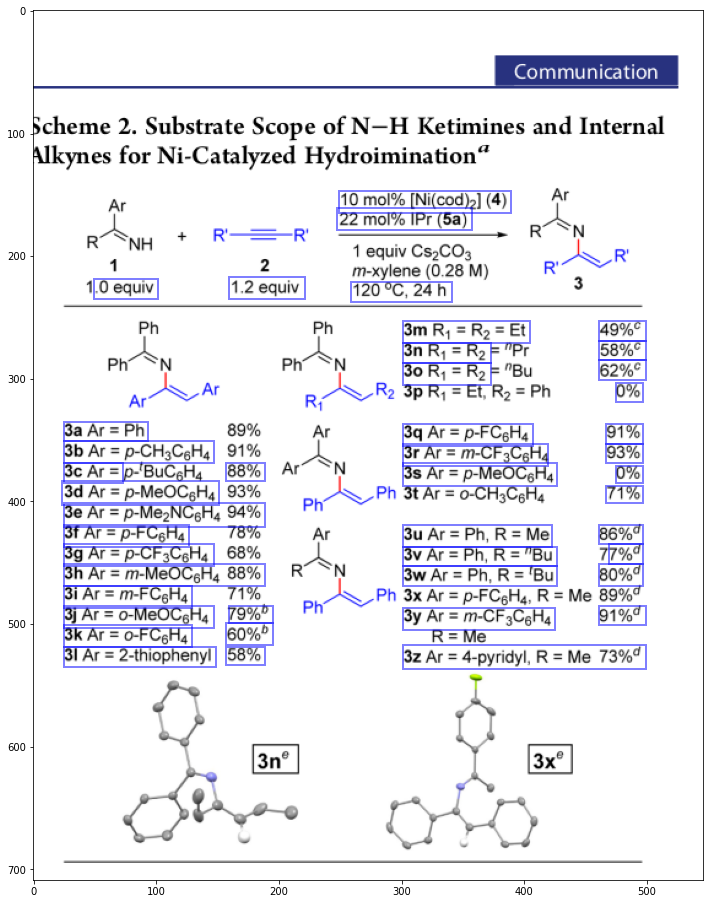

['3d', '3b', '3c', '3a', '3e', '3f', '3g', '3h', '3i', '3j', '3k', '3l', '3m', '3w', '3s', '3q', '3n', '3y', '3r', '3u', '3o', '3v', '3z', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  3d
Considering ... 3b
has same prefix as title. Checking ...
added
Considering ... 3c
has same prefix as title. Checking ...
added
Considering ... 3a
has same prefix as title. Checking ...
added
Considering ... 3e
has same prefix as title. Checking ...
added
Considering ... 3f
has same prefix as title. Checking ...
added
Considering ... 3g
has same prefix as title. Checking ...
added
Considering ... 3h
has same prefix as title. Checking ...
added
Considering ... 3i
has same prefix as title. Checking ...
added
Considering ... 3j
has same prefix as title. Checking ...
added
Considering ... 3k
has same prefix as title. Checking ...
added
Considering ... 3l
has same prefix as title. Checking ...
added
Considering ... 3m
has same prefix as

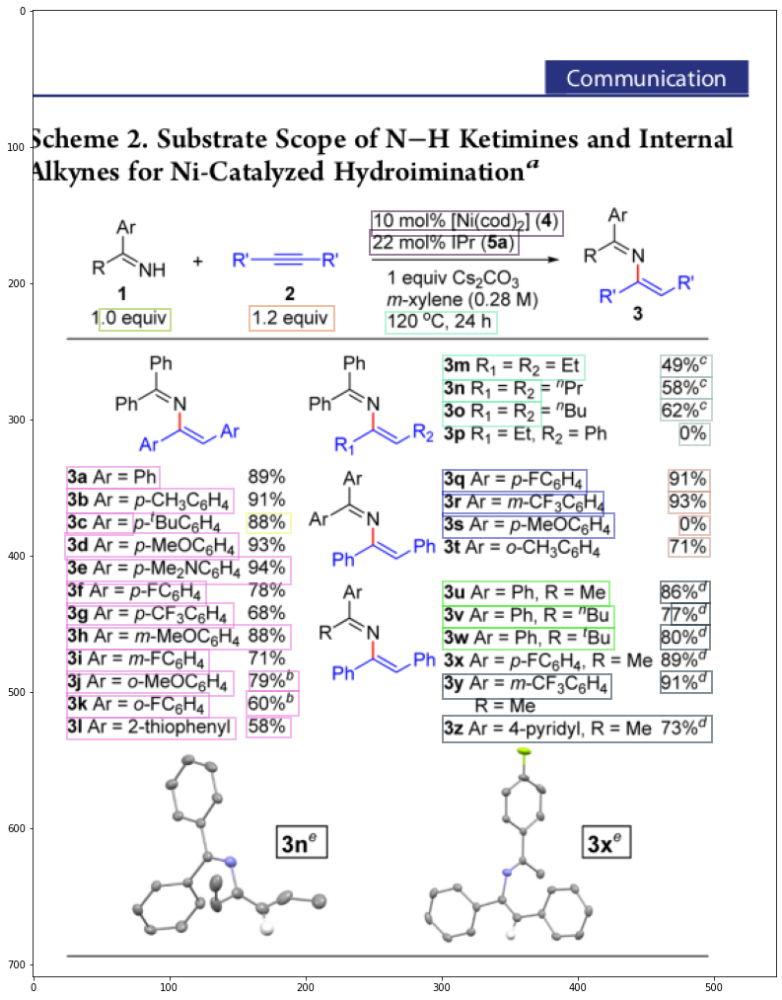

=========== jacs-6.png ============


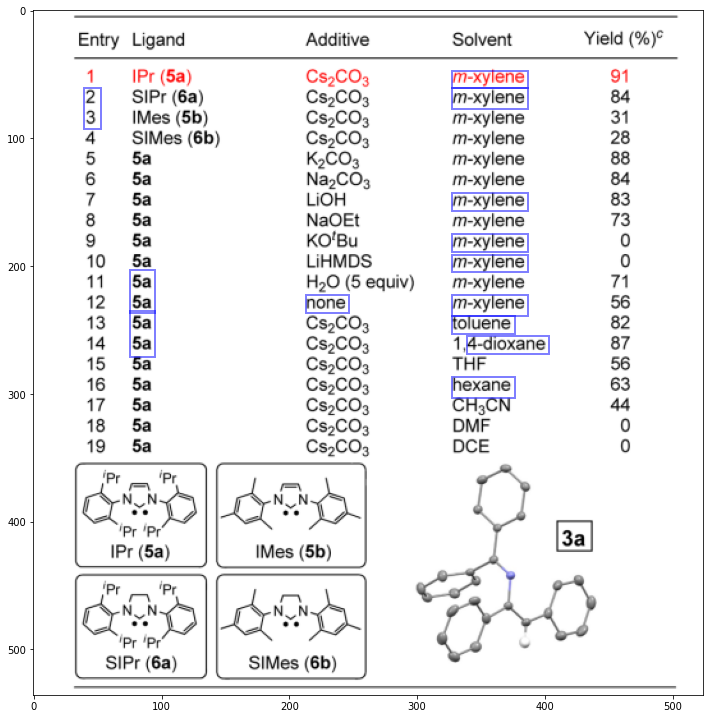

['5a', '5a', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  5a
Considering ... 5a
has same prefix as title. Checking ...
added
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
=== new group ===
Starting with  
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
added
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
added
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
Considering ...

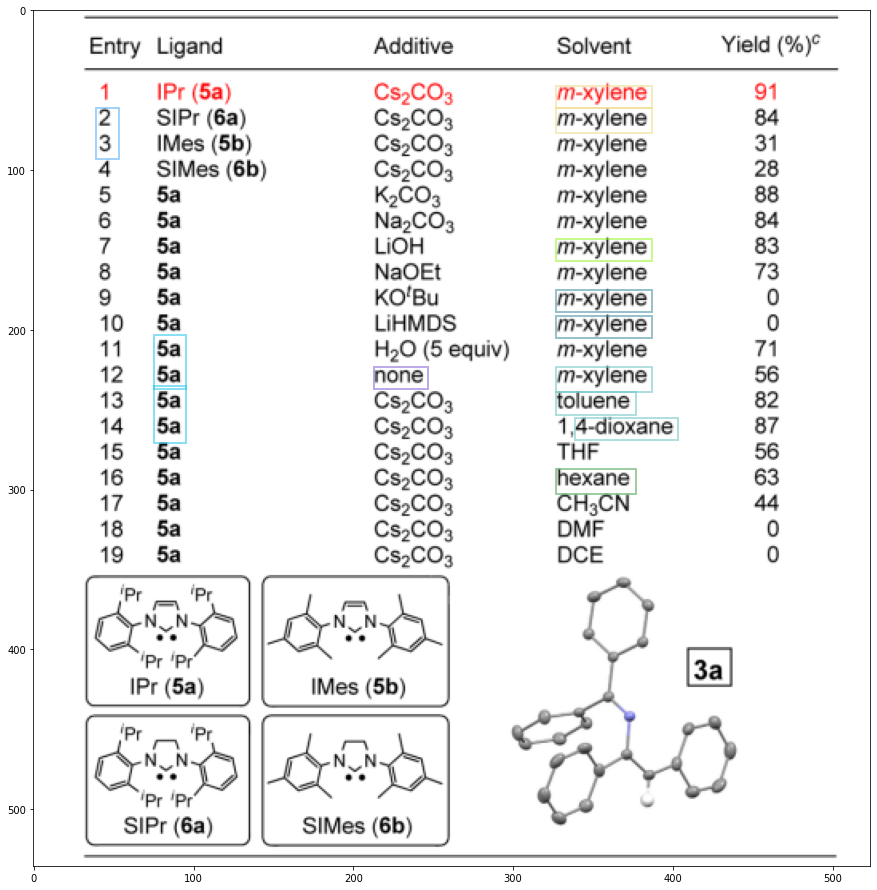

=========== jacs-7.png ============


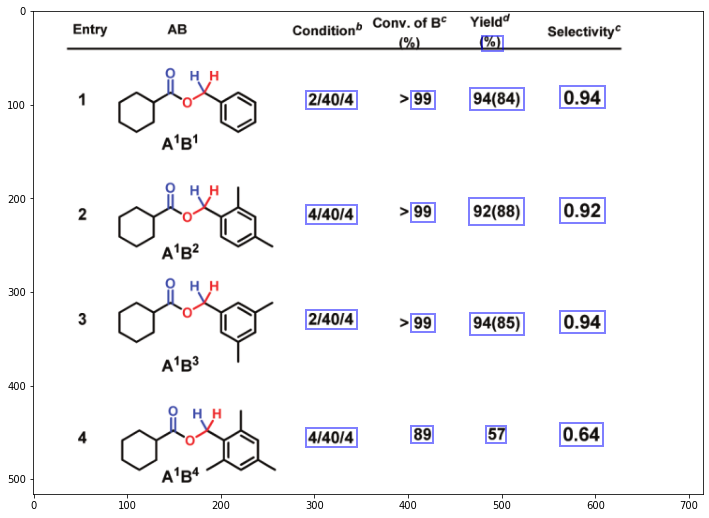

['', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
=== new group ===
Starting with  
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
Considering ... 
=== new group ===
Starting with  
Considering ... 
Considering ... 
Considering .

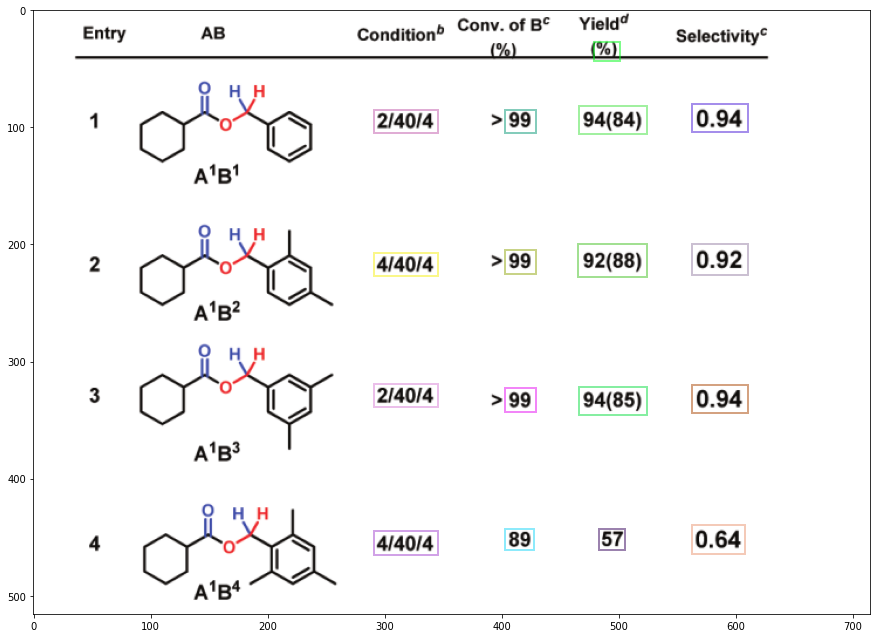

In [7]:
import os

for t0, t1, files in os.walk(path):
#    break
    for iname in sorted(files):
        print('=========== '+iname+' ============')
        result = reader.readtext(path+iname)
        image = mpimg.imread(path+iname)

        tboxes, text = filter_result_easyocr_to_x1y1x2y2text(result) # convert to box x1,y1,x2,y2
        imshow(image, tboxes= tboxes)

        clusters = merge_textboxes(tboxes, text)
        plt.figure(figsize = (15,18))
        plt.imshow(image)
        for cluster in clusters:
            color = list(np.random.choice(range(256), size=3)/255)
            for box in cluster:
                draw_box(box, color)
            
        plt.plot()
        plt.show()  

In [8]:
result = reader.readtext(path+'anie-2.png')
result

[([[6, 10], [72, 10], [72, 34], [6, 34]], 'Table 2:', 0.8240449096345316),
 ([[76, 11], [206, 11], [206, 35], [76, 35]],
  'Substrate Scope.',
  0.9700880998710584),
 ([[167, 57], [215, 57], [215, 73], [167, 73]],
  'Ni(cod)2',
  0.5871575566655879),
 ([[229, 57], [263, 57], [263, 71], [229, 71]], 'mcl%,', 0.2804830498382656),
 ([[419, 57], [465, 57], [465, 71], [419, 71]],
  'Milcodi2',
  0.09989051835859415),
 ([[479, 55], [517, 55], [517, 69], [479, 69]], 'mol%}', 0.8589253929892817),
 ([[701, 52], [895, 52], [895, 69], [701, 69]],
  'Camplete enda selective cyclizatlon',
  0.6200366672766975),
 ([[925, 53], [1117, 53], [1117, 69], [925, 69]],
  'Excellent functional group tolerance',
  0.548594866660063),
 ([[171, 73], [209, 73], [209, 87], [171, 87]], 'L3IHCI', 0.19977634480993342),
 ([[225, 73], [259, 73], [259, 87], [225, 87]], 'mol%', 0.46611744683831513),
 ([[421, 73], [511, 73], [511, 87], [421, 87]],
  'L2IHCI [5 iul%)',
  0.21770731156955042),
 ([[699, 77], [821, 77], [821,

End! 

Next task: because there ere two formats of figure-description 

* near-by description: 
catal-1
catal-2
catal-4
catal-5
catal-6
anie-1
anie-2
anie-3
anie-5
anie-6

* table description: rest

so for table description, we need to modify the code!